In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os


def load_and_preprocess_images(folder_path, image_size=(64, 64)):
    data = []
    images = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith((".png", ".jpg", ".jpeg", ".bmp", ".gif")):
            image_path = os.path.join(folder_path, filename)
            try:
                with Image.open(image_path).convert("RGB") as img:
                    img = img.resize(image_size)
                    img_array = np.array(img) / 255.0
                    data.append(img_array.flatten())
                    images.append(img_array)
            except Exception as e:
                print(f"Failed to load {image_path}: {e}")

    data = np.array(data)
    images = np.array(images)

    return data, images


data, images = load_and_preprocess_images("data")

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F


class AutoEncoder(nn.Module):
    def __init__(self, encoding_dim=2, input_dim=64 * 64 * 3):
        super(AutoEncoder, self).__init__()

        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Dropout(0.2),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.2),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),
            nn.Linear(128, encoding_dim),
        )

        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),
            nn.Dropout(0.2),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.2),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Linear(512, input_dim),
            nn.Sigmoid(),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [37]:
def train_autoencoder(
    model,
    optimizer,
    device,
    criterion,
    data,
    batch_size=256,
    epochs=100,
    validation_split=0.2,
    patience=10,
    model_path="models/best_model.pt",
):
    from torch.utils.data import DataLoader, TensorDataset, random_split

    # Convert data to PyTorch tensors
    data_tensor = torch.tensor(data, dtype=torch.float32)

    # Create train/val split
    val_size = int(len(data_tensor) * validation_split)
    train_size = len(data_tensor) - val_size
    train_data, val_data = random_split(data_tensor, [train_size, val_size])

    # Dataloaders
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)

    best_loss = float("inf")
    epochs_no_improve = 0

    loss_tab = []
    val_loss_tab = []

    print("Training model...")
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for batch in train_loader:
            batch = batch.to(device)
            optimizer.zero_grad()
            output = model(batch)
            loss = criterion(output, batch)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * batch.size(0)

        train_loss /= len(train_loader.dataset)
        loss_tab.append(train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for batch in val_loader:
                batch = batch.to(device)
                output = model(batch)
                loss = criterion(output, batch)
                val_loss += loss.item() * batch.size(0)

        val_loss /= len(val_loader.dataset)
        val_loss_tab.append(val_loss)

        print(
            f"Epoch {epoch + 1}/{epochs} — Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}"
        )

        # Checkpointing
        if loss < best_loss:
            best_loss = loss
            torch.save(model.state_dict(), model_path)
            print(f"✅ Validation loss improved. Model saved to {model_path}")
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            print(f"⚠️ No improvement for {epochs_no_improve} epoch(s).")

        # Early stopping
        if epochs_no_improve >= patience:
            print("⏹️ Early stopping triggered.")
            break

    print("Training complete.")
    return loss_tab, val_loss_tab


In [133]:
encoding_dim = 2
model = AutoEncoder(encoding_dim)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

AutoEncoder(
  (encoder): Sequential(
    (0): Linear(in_features=12288, out_features=512, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=512, out_features=256, bias=True)
    (5): ReLU()
    (6): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): Linear(in_features=256, out_features=128, bias=True)
    (9): ReLU()
    (10): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Linear(in_features=128, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=128, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=128, out_features=256, bias=True)
    (5): ReLU()
    

In [ ]:
loss, val_loss = train_autoencoder(
    model=model,
    optimizer=optimizer,
    device=device,
    criterion=criterion,
    data=data,
    batch_size=32,
    epochs=150,
    validation_split=0.1,
    patience=150,
    model_path="models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-5.pt",
)

Training model...
Epoch 1/150 — Train Loss: 0.0873, Val Loss: 0.0764
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 2/150 — Train Loss: 0.0784, Val Loss: 0.0666
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 3/150 — Train Loss: 0.0682, Val Loss: 0.0579
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 4/150 — Train Loss: 0.0611, Val Loss: 0.0527
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 5/150 — Train Loss: 0.0569, Val Loss: 0.0506
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 6/150 — Train Loss: 0.0545, Val Loss: 0.0487
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt
Epoch 7/150 — Train Loss: 0.0524, Val Loss: 0.0472
✅ Validation 

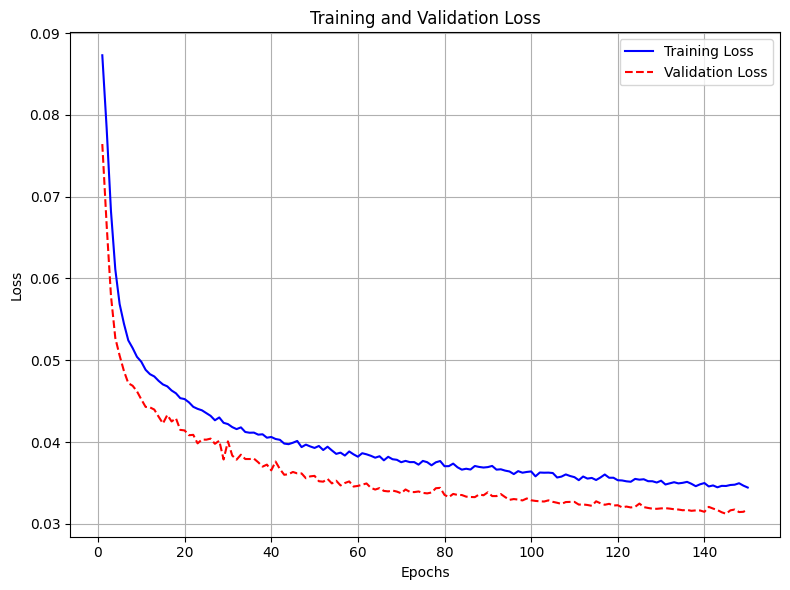

In [137]:
def plot_loss(loss, val_loss, title):
    epochs = range(1, len(loss) + 1)
    plt.figure(figsize=(8, 6))
    plt.plot(epochs, loss, "b-", label="Training Loss")
    plt.plot(epochs, val_loss, "r--", label="Validation Loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("imgs/autoencoder/" + title + ".png")
    plt.show()


plot_loss(loss, val_loss, title="naruto_training_loss_2d_1e-1")


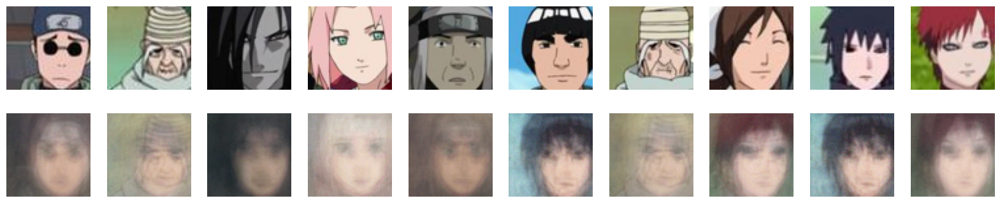

In [138]:
model = AutoEncoder(encoding_dim=2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt",
        map_location=device,
    )
)
model.eval()

with torch.no_grad():
    input_tensor = torch.tensor(data, dtype=torch.float32)
    input_tensor = input_tensor.to(device)
    reconstructed = model(input_tensor)

decoded_images = np.clip(reconstructed * 255, 0, 255).cpu().numpy()
decoded_images = decoded_images.reshape(-1, 64, 64, 3).astype(np.uint8)
n = 10

random_indices = np.random.choice(len(data), n, replace=False)

plt.figure(figsize=(20, 4))
for i, idx in enumerate(random_indices):
    # Original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(images[idx])
    ax.axis("off")

    # Reconstructed
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_images[idx])
    ax.axis("off")

plt.savefig("imgs/autoencoder/naruto_reconstructed_images_2d_1e-1.png")
plt.show()

In [139]:
import random

seed = 42
np.random.seed(seed)
random.seed(seed)


def plot_latent_space_with_labels(encoded_data, title):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        encoded_data[:, 0],
        encoded_data[:, 1],
        alpha=1,
        edgecolors="w",
        linewidth=0.5,
        # s=5,
    )
    plt.xlabel("Latent Variable 1")
    # plt.xlim(-12, 12)
    plt.ylabel("Latent Variable 2")
    # plt.ylim(-12, 12)
    plt.title("Latent Space Representation")
    plt.savefig("imgs/autoencoder/" + title + ".png")
    plt.show()


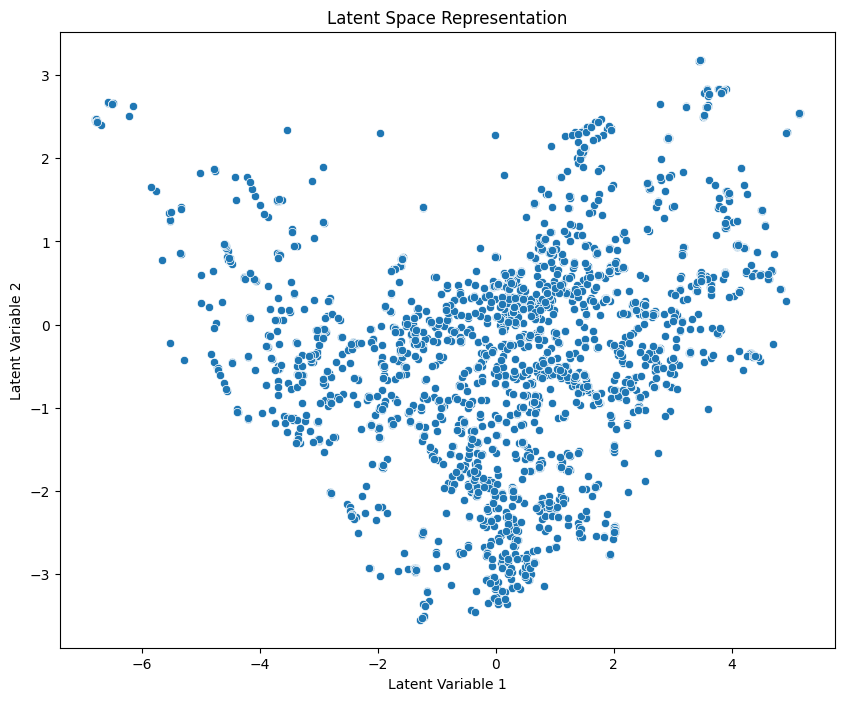

In [140]:
model = AutoEncoder(encoding_dim=2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt",
        map_location=device,
    )
)
model.eval()

encoder = model.encoder
encoder.eval()

with torch.no_grad():
    input_tensor = torch.tensor(data, dtype=torch.float32).to(device)
    encoded_data = encoder(input_tensor)

indices = np.arange(encoded_data.shape[0])
np.random.shuffle(indices)
encoded_data = encoded_data[indices]

plot_latent_space_with_labels(encoded_data, title="naruto_latent_space_2d_1e-1")

In [ ]:
def sample_and_visualize_latent_space(
    decoder,
    latent_range=(-25, 25),
    grid_size=10,
    img_shape=(64, 64, 3),
    title="latent_space_samples",
):
    linspace = np.linspace(latent_range[0], latent_range[1], grid_size)
    latent_grid = np.array(
        [[x, y] for y in reversed(linspace) for x in linspace], dtype=np.float32
    )
    print(latent_grid)
    latent_tensor = torch.tensor(latent_grid, dtype=torch.float32).to(
        next(decoder.parameters()).device
    )

    with torch.no_grad():
        decoded = decoder(latent_tensor).cpu().numpy()

    plt.figure(figsize=(grid_size, grid_size))
    for i in range(grid_size * grid_size):
        ax = plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(decoded[i].reshape(img_shape), cmap="gray")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig("imgs/autoencoder/" + title + ".png")
    plt.show()


[[-8.         8.       ]
 [-6.2222223  8.       ]
 [-4.4444447  8.       ]
 [-2.6666667  8.       ]
 [-0.8888889  8.       ]
 [ 0.8888889  8.       ]
 [ 2.6666667  8.       ]
 [ 4.4444447  8.       ]
 [ 6.2222223  8.       ]
 [ 8.         8.       ]
 [-8.         6.2222223]
 [-6.2222223  6.2222223]
 [-4.4444447  6.2222223]
 [-2.6666667  6.2222223]
 [-0.8888889  6.2222223]
 [ 0.8888889  6.2222223]
 [ 2.6666667  6.2222223]
 [ 4.4444447  6.2222223]
 [ 6.2222223  6.2222223]
 [ 8.         6.2222223]
 [-8.         4.4444447]
 [-6.2222223  4.4444447]
 [-4.4444447  4.4444447]
 [-2.6666667  4.4444447]
 [-0.8888889  4.4444447]
 [ 0.8888889  4.4444447]
 [ 2.6666667  4.4444447]
 [ 4.4444447  4.4444447]
 [ 6.2222223  4.4444447]
 [ 8.         4.4444447]
 [-8.         2.6666667]
 [-6.2222223  2.6666667]
 [-4.4444447  2.6666667]
 [-2.6666667  2.6666667]
 [-0.8888889  2.6666667]
 [ 0.8888889  2.6666667]
 [ 2.6666667  2.6666667]
 [ 4.4444447  2.6666667]
 [ 6.2222223  2.6666667]
 [ 8.         2.6666667]


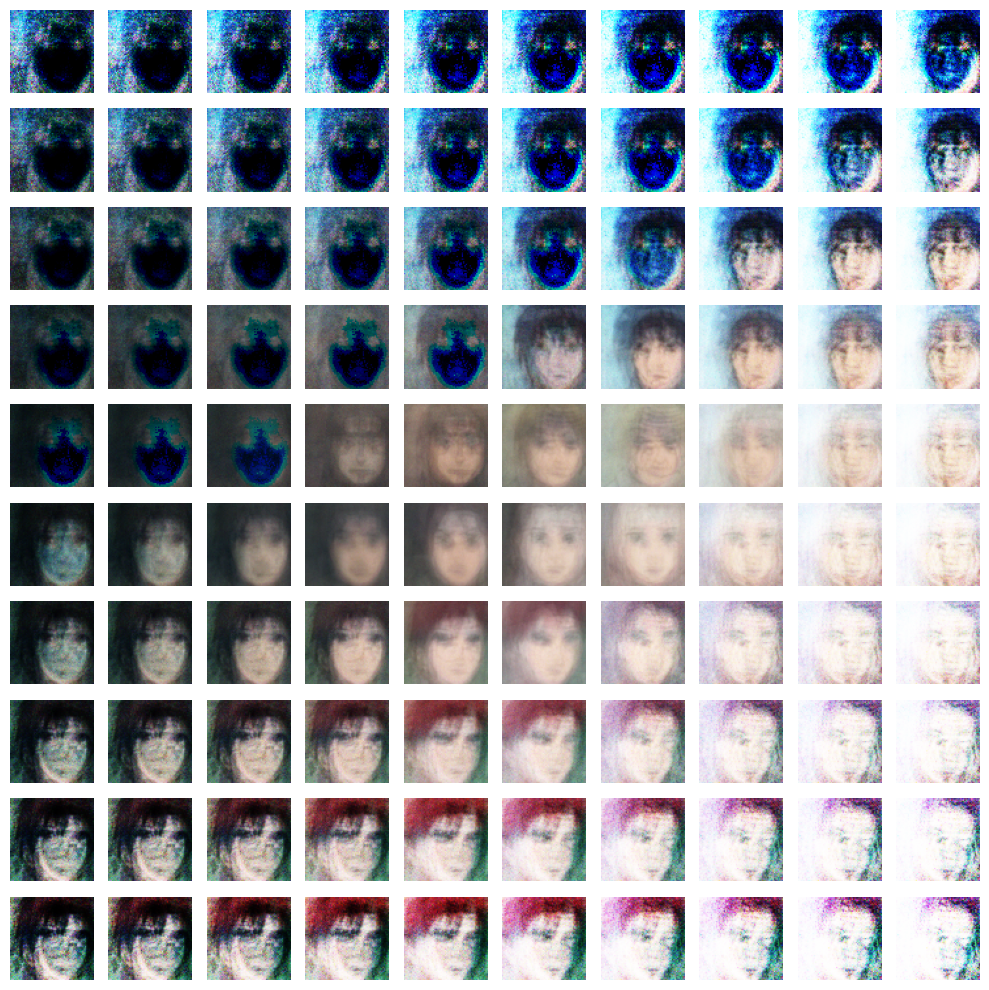

In [ ]:
sample_and_visualize_latent_space(
    model.decoder,
    latent_range=(-8, 8),
    grid_size=10,
    img_shape=(64, 64, 3),
    title="naruto_latent_space_samples_2d_1e-1",
)

In [144]:
encoding_dim = 64
model = AutoEncoder(encoding_dim)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


AutoEncoder(
  (encoder): Sequential(
    (0): Linear(in_features=12288, out_features=512, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=512, out_features=256, bias=True)
    (5): ReLU()
    (6): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): Linear(in_features=256, out_features=128, bias=True)
    (9): ReLU()
    (10): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Linear(in_features=128, out_features=64, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=128, out_features=256, bias=True)
    (5): ReLU()
  

In [145]:
loss, val_loss = train_autoencoder(
    model=model,
    optimizer=optimizer,
    device=device,
    criterion=criterion,
    data=data,
    batch_size=32,
    epochs=150,
    validation_split=0.1,
    patience=10,
    model_path="models/best_autoencoder_naruto_64d_lr_1e-5.pt",
)


Training model...
Epoch 1/150 — Train Loss: 0.0883, Val Loss: 0.0779
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 2/150 — Train Loss: 0.0805, Val Loss: 0.0682
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 3/150 — Train Loss: 0.0697, Val Loss: 0.0590
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 4/150 — Train Loss: 0.0614, Val Loss: 0.0535
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 5/150 — Train Loss: 0.0566, Val Loss: 0.0506
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 6/150 — Train Loss: 0.0536, Val Loss: 0.0486
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Epoch 7/150 — Train Loss: 0.0516, Val Loss: 0.0471
✅ Validation loss improved. Model saved to models/best_autoencoder_naruto_64d_lr_1e-5.pt
Ep

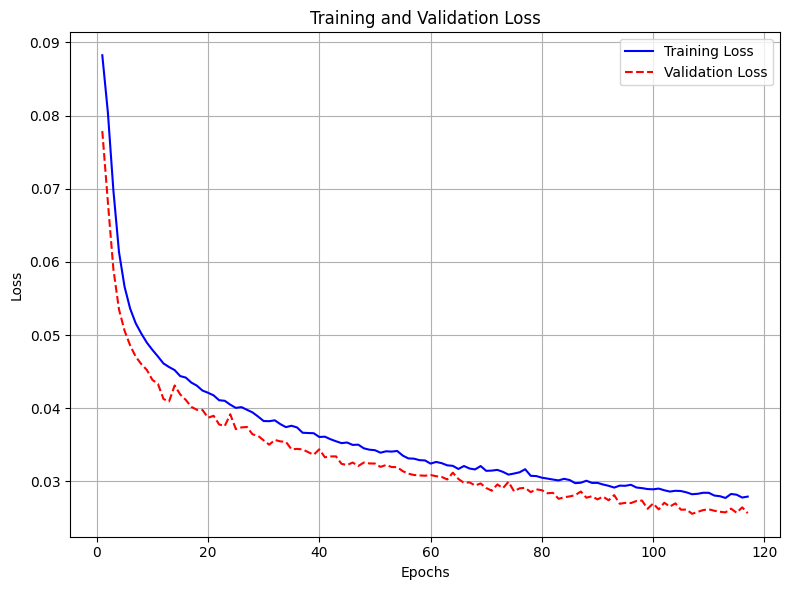

In [146]:
plot_loss(loss, val_loss, title="naruto_training_loss_64d_1e-5")

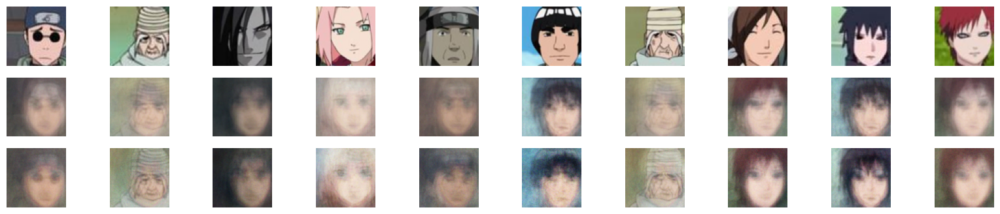

In [148]:
model = AutoEncoder(encoding_dim=64)
model_2d = AutoEncoder(encoding_dim=2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model_2d.to(device)

model.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_64d_lr_1e-5.pt",
        map_location=device,
    )
)
model.eval()

model_2d.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-1.pt",
        map_location=device,
    )
)
model_2d.eval()

with torch.no_grad():
    input_tensor = torch.tensor(data, dtype=torch.float32)
    input_tensor = input_tensor.to(device)
    reconstructed_64d = model(input_tensor)
    reconstructed_2d = model_2d(input_tensor)

decoded_images_64d = np.clip(reconstructed_64d * 255, 0, 255).cpu().numpy()
decoded_images_2d = np.clip(reconstructed_2d * 255, 0, 255).cpu().numpy()
decoded_images_64d = decoded_images_64d.reshape(-1, 64, 64, 3).astype(np.uint8)
decoded_images_2d = decoded_images_2d.reshape(-1, 64, 64, 3).astype(np.uint8)
n = 10

plt.figure(figsize=(20, 4))
for i, idx in enumerate(random_indices):
    # Original
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(images[idx])
    ax.axis("off")

    # Reconstructed 2D
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(decoded_images_2d[idx])
    ax.axis("off")

    # Reconstructed 64D
    ax = plt.subplot(3, n, i + 1 + 2 * n)
    plt.imshow(decoded_images_64d[idx])
    ax.axis("off")

plt.savefig("imgs/autoencoder/naruto_reconstructed_images_64d_vs_2d_1e-5.png")
plt.show()


# Génération d'image

# 2D


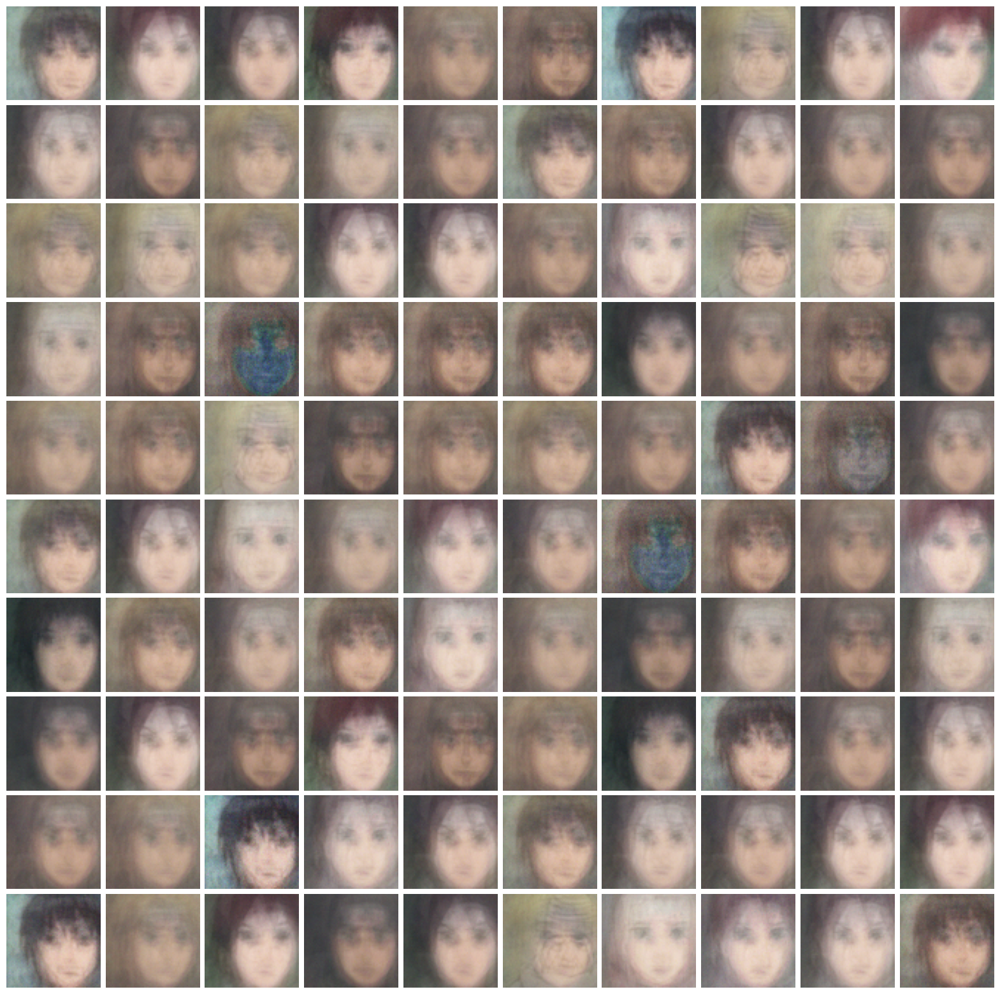

In [ ]:
import math

model = AutoEncoder(encoding_dim=2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_2d_no_early_stop_lr_1e-5.pt",
        map_location=device,
    )
)
model.eval()


def generate_and_plot_images(
    decoder,
    encoding_dim,
    num_images=400,
    image_size=(28, 28),
    device="cpu",
    title="generated_images",
):
    num_images_per_row = int(math.sqrt(num_images))
    decoder.eval()

    # Generate random latent vectors
    z = torch.randn(num_images, encoding_dim).to(device)

    # Decode to images
    with torch.no_grad():
        generated_images = decoder(z).cpu().view(-1, *image_size)

    fig, axes = plt.subplots(num_images_per_row, num_images_per_row, figsize=(20, 20))
    for i, ax in enumerate(axes.flat):
        ax.imshow(generated_images[i], cmap="gray")
        ax.axis("off")

    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.savefig("imgs/autoencoder/" + title + ".png")
    plt.show()


generate_and_plot_images(
    model.decoder,
    encoding_dim=2,
    num_images=100,
    image_size=(64, 64, 3),
    device=device,
    title="naruto_generated_images_2d_1e-5",
)


# 64D


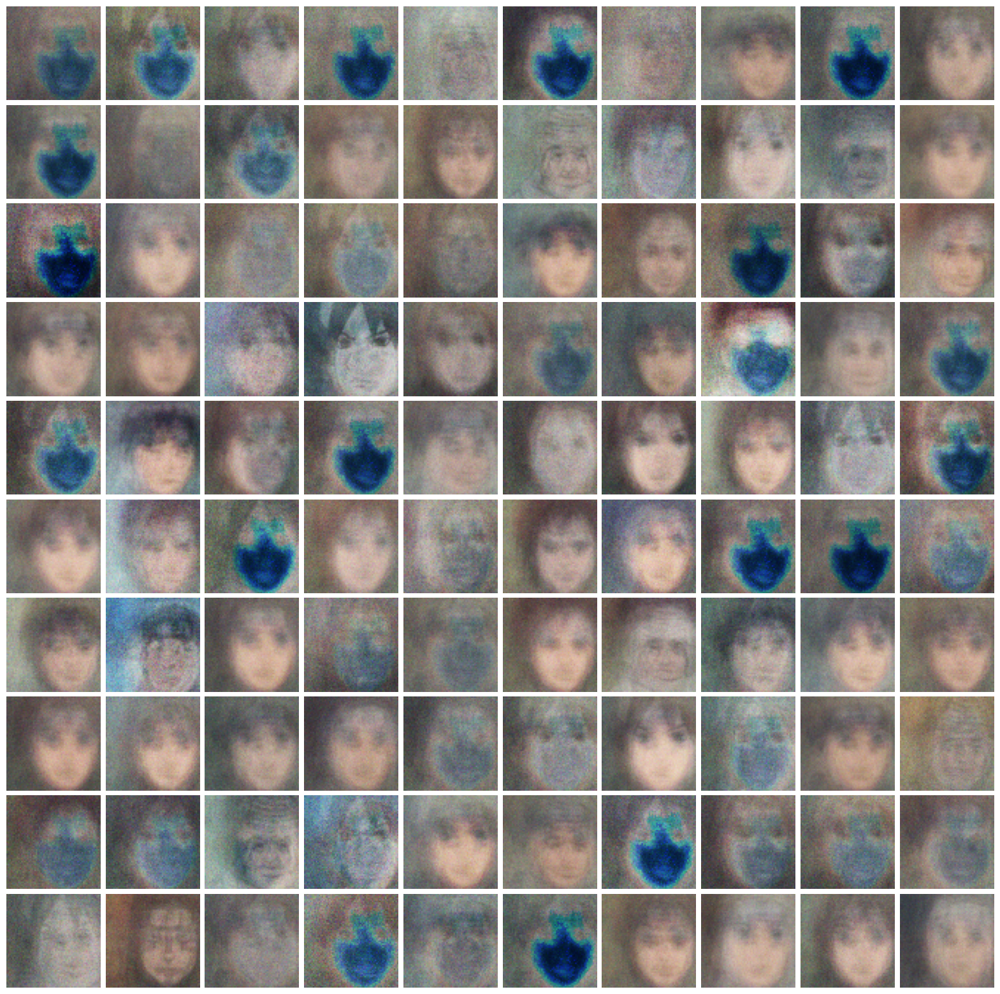

In [150]:
model = AutoEncoder(encoding_dim=64)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.load_state_dict(
    torch.load(
        "models/best_autoencoder_naruto_64d_lr_1e-5.pt",
        map_location=device,
    )
)
model.eval()

generate_and_plot_images(
    model.decoder,
    encoding_dim=64,
    num_images=100,
    image_size=(64, 64, 3),
    device=device,
    title="naruto_generated_images_64d_1e-5",
)